**Author: Svenja Gaedcke**  
gaedcke.svenja@mh-hannover.de  
 

# Setup

In [1]:
%matplotlib inline
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

import sys
import os
import numpy as np
import pandas as pd
import scanpy as sc
import datetime
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (4,4)
from matplotlib import rcParams
import seaborn as sb

#Read config file
import configparser as config
config = config.ConfigParser()
config.read('./config.ini')
#os.chdir(config['PATHS']["OUTPUT"])

sc.settings.verbosity = 0      
sc.logging.print_header()
sc.settings.set_figure_params(dpi=150)
sc.settings.figdir = config['PATHS']["OUTPUT"]+"/figs/"
sc._settings.n_jobs = 5
sc._settings.max_memory = 80 #GB
sc.set_figure_params(scanpy=True, dpi=100, dpi_save=600,
                         frameon=True, vector_friendly=True, 
                         fontsize=14, color_map=None, format='pdf',
                         transparent=True )
sc._settings.savefigs = False

scanpy==1.5.1 anndata==0.7.4 umap==0.4.6 numpy==1.21.5 scipy==1.7.3 pandas==1.1.2 scikit-learn==1.0.2 statsmodels==0.12.0 python-igraph==0.8.2 louvain==0.7.0 leidenalg==0.7.0


# Read Data

In [2]:
filenames = [
    config['PATHS']["DATA"]+"/N1535_N1541/outs/filtered_feature_bc_matrix/",
    config['PATHS']["DATA"]+"/N1536_N1542/outs/filtered_feature_bc_matrix/",
    config['PATHS']["DATA"]+"/N1537_N1543/outs/filtered_feature_bc_matrix/"]
sample_string = [ "N1535_N1541", "N1536_N1542", "N1537_N1543"]
sample_description= [ "nuclei_control", "nuclei_17min", "nuclei_27min"]
sample_id = ["0","1","2"]
marker_gene_file= config['PATHS']["DATA"]+"/KideyMarkerGenes.txt"

#read first data
adata = sc.read_10x_mtx(filenames[0], var_names="gene_symbols", cache=True)
adata.obs["sample"] = [sample_string[0]]*adata.n_obs
adata.obs["sample_description"] =  [sample_description[0]]*adata.n_obs
adata.obs["batch"] = ["batch_0"]*adata.n_obs
adata.var_names_make_unique() 
print(adata)

#read additional data
for index,filepath in enumerate(filenames[1:], start=1):
    #print(index, filepath)
    adata_tmp = sc.read_10x_mtx(filepath, var_names="gene_symbols", cache=True)
    adata_tmp.obs["sample"] = [sample_string[index]]*adata_tmp.n_obs
    adata_tmp.obs["sample_id"] = [str(index)]*adata_tmp.n_obs
    adata_tmp.obs["sample_description"] =  [sample_description[index]]*adata_tmp.n_obs
    adata_tmp.obs["batch"] = ["batch_"+str(index)]*adata_tmp.n_obs
    adata_tmp.var_names_make_unique() 
    
    #concatenate to main data
    adata = adata.concatenate(adata_tmp, batch_key='sample_id')
    adata.obs.drop(columns=['sample_id'], inplace=True)

AnnData object with n_obs × n_vars = 7905 × 31053
    obs: 'sample', 'sample_description', 'batch'
    var: 'gene_ids', 'feature_types'


# Preprocessing:

In [3]:
raw_cellnumber = len(adata.obs)
adata.var["mt"] = adata.var_names.str.startswith('mt-')
sc.pp.calculate_qc_metrics(adata, qc_vars=["mt"], inplace=True)

### Filter

In [4]:
#QC with set thresholds:
sc.pp.filter_cells(adata, min_genes=200) #remove cell if less then 200 genes in cell expressed
sc.pp.filter_genes(adata, min_cells=3)   #remove gene if less then 3 cells express the gene
#determine thresholds:
#add cell size as observations-annotation to adata
adata.obs['n_counts'] = adata.X.sum(axis=1).A1

mito_genes = adata.var_names.str.startswith('mt-') # get mt genes
# for each cell compute fraction of counts in mito genes vs. all genes
# the `.A1` is only necessary as X is sparse (to transform to a dense array after summing)
adata.obs['percent_mito'] = np.sum(
    adata[:, mito_genes].X, axis=1).A1 / np.sum(adata.X, axis=1).A1

print("Counts per Cell: ",np.mean(adata.obs['n_counts']))
print("Genes per Cell: ",np.mean(adata.obs['n_genes']))

#filtering by Thresholds:
print(adata[adata.obs.n_genes >= 8000, :].shape[0], " cells were removed with more then 8,000 genes expressed")
adata = adata[adata.obs.n_genes < 8000, :]

print("% of removed cells by filtering:", (raw_cellnumber-len(adata.obs))/raw_cellnumber*100 )
print("%mt per gene (mean):", np.mean(adata.obs.percent_mito)*100)
print(adata[adata.obs.percent_mito >= 0.05, :].shape[0], " cells were removed with more then 5% mt genes")
adata = adata[adata.obs.percent_mito < 0.05, :]

print("Counts per Cell: ",np.mean(adata.obs['n_counts']))
print("Genes per Cell: ",np.mean(adata.obs['n_genes']))
print("% of removed cells by filtering and mt:", (raw_cellnumber-len(adata.obs))/raw_cellnumber*100 )

Counts per Cell:  1920.1367
Genes per Cell:  878.7127982010168
0  cells were removed with more then 8,000 genes expressed
% of removed cells by filtering: 3.759115502234768
%mt per gene (mean): 11.614887416362762
8151  cells were removed with more then 5% mt genes
Counts per Cell:  1660.0211
Genes per Cell:  912.9276716781796
% of removed cells by filtering and mt: 42.10773935544578


In [5]:
#normalize per cell:
sc.pp.normalize_total(adata,exclude_highly_expressed =True)

#log:
sc.pp.log1p(adata)
adata.raw = adata # save current data (normlaized and log-transformed) as raw 

/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA/lib/python3.7/site-packages/scanpy/preprocessing/_normalization.py:138: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


## Douplets

N1535_N1541
Preprocessing...


/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA/lib/python3.7/site-packages/scrublet/helper_functions.py:239: RuntimeWarning: invalid value encountered in log
  gLog = lambda input: np.log(input[1] * np.exp(-input[0]) + input[2])
/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA/lib/python3.7/site-packages/scrublet/helper_functions.py:251: RuntimeWarning: invalid value encountered in sqrt
  CV_eff = np.sqrt((1+a)*(1+b) - 1);
/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA/lib/python3.7/site-packages/scrublet/helper_functions.py:252: RuntimeWarning: invalid value encountered in sqrt
  CV_input = np.sqrt(b);


Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...


Trying to set attribute `.obs` of view, copying.


Automatically set threshold at doublet score = 0.50
Detected doublet rate = 0.6%
Estimated detectable doublet fraction = 28.8%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 2.0%
Elapsed time: 2.4 seconds


... storing 'sample' as categorical
... storing 'sample_description' as categorical
... storing 'batch' as categorical
... storing 'feature_types' as categorical


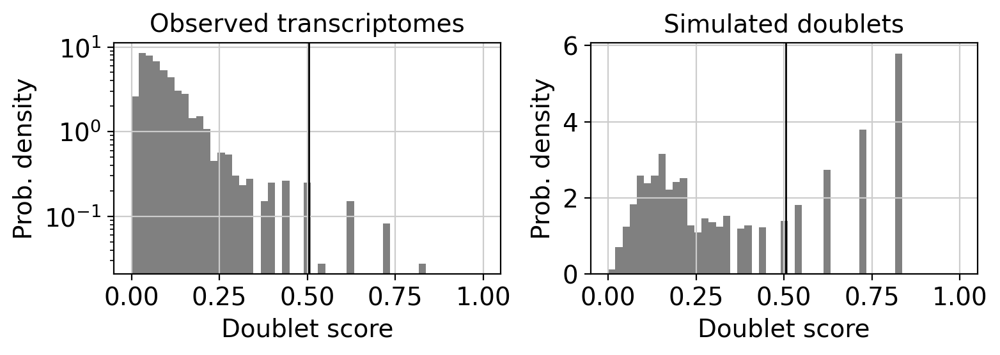

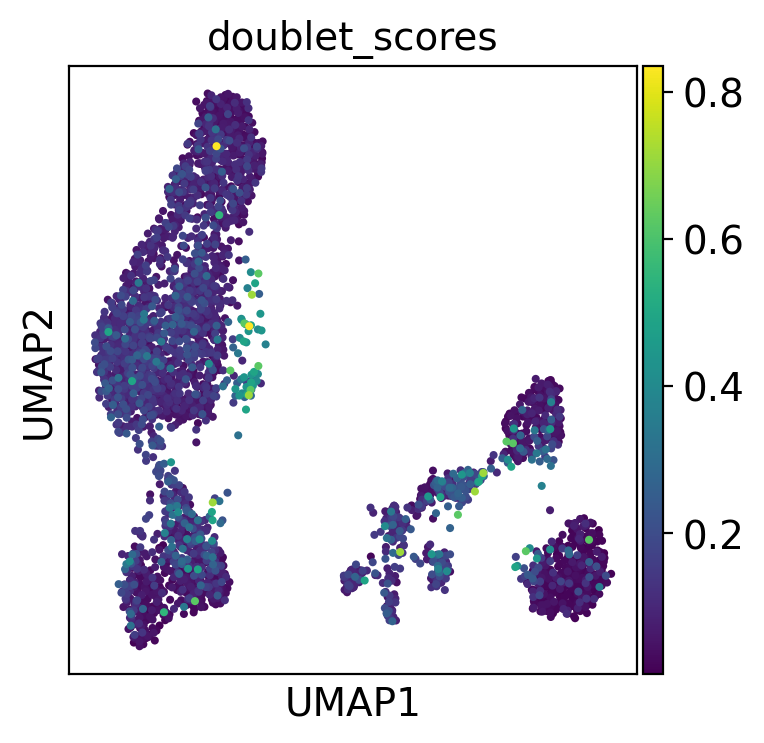

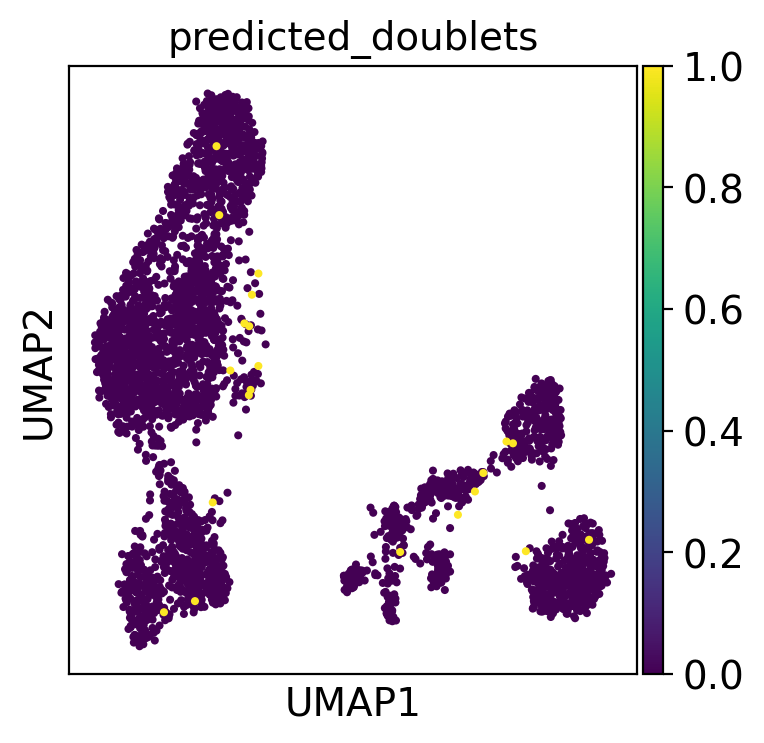

N1536_N1542
Preprocessing...


/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA/lib/python3.7/site-packages/scrublet/helper_functions.py:239: RuntimeWarning: invalid value encountered in log
  gLog = lambda input: np.log(input[1] * np.exp(-input[0]) + input[2])
/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA/lib/python3.7/site-packages/scrublet/helper_functions.py:252: RuntimeWarning: invalid value encountered in sqrt
  CV_input = np.sqrt(b);


Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...


Trying to set attribute `.obs` of view, copying.


Automatically set threshold at doublet score = 0.63
Detected doublet rate = 0.1%
Estimated detectable doublet fraction = 1.5%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 8.7%
Elapsed time: 4.6 seconds


... storing 'sample' as categorical
... storing 'sample_description' as categorical
... storing 'batch' as categorical
... storing 'feature_types' as categorical


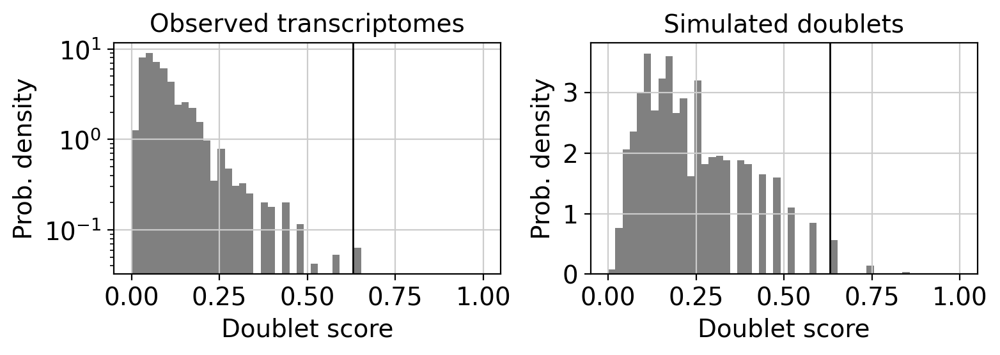

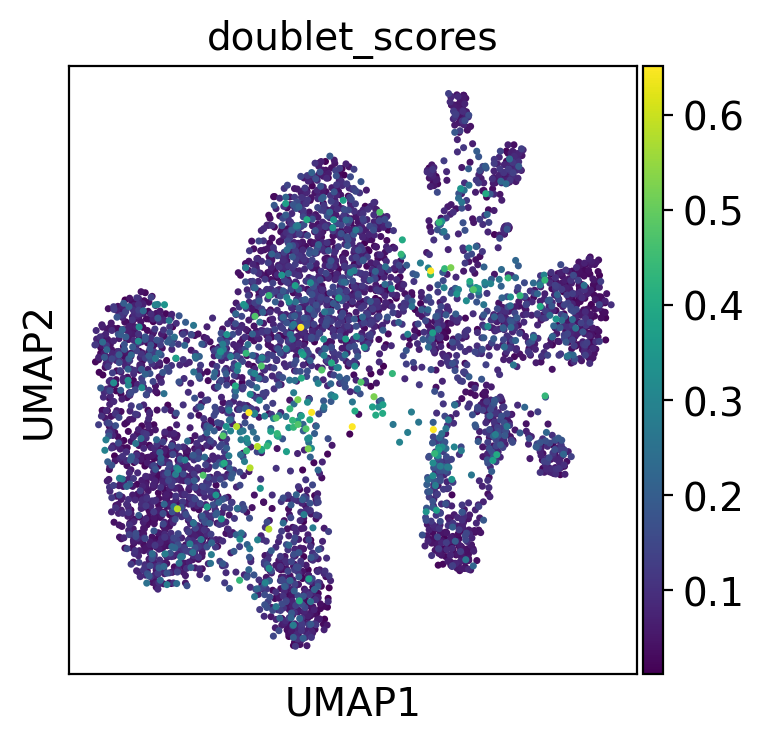

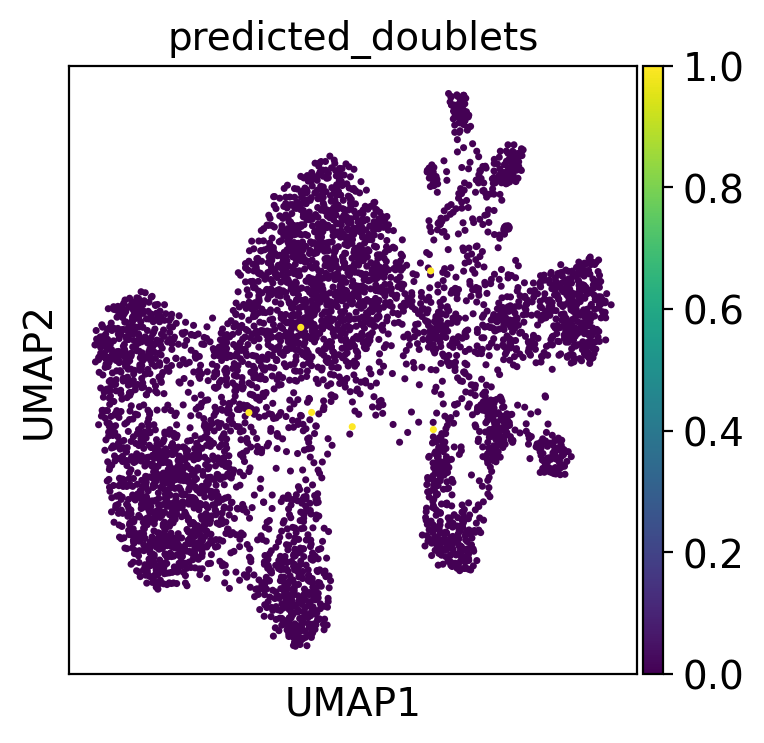

N1537_N1543
Preprocessing...


/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA/lib/python3.7/site-packages/scrublet/helper_functions.py:239: RuntimeWarning: invalid value encountered in log
  gLog = lambda input: np.log(input[1] * np.exp(-input[0]) + input[2])
/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA/lib/python3.7/site-packages/scrublet/helper_functions.py:251: RuntimeWarning: invalid value encountered in sqrt
  CV_eff = np.sqrt((1+a)*(1+b) - 1);
/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA/lib/python3.7/site-packages/scrublet/helper_functions.py:252: RuntimeWarning: invalid value encountered in sqrt
  CV_input = np.sqrt(b);


Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...


Trying to set attribute `.obs` of view, copying.


Automatically set threshold at doublet score = 0.69
Detected doublet rate = 0.0%
Estimated detectable doublet fraction = 0.3%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 0.0%
Elapsed time: 3.3 seconds


... storing 'sample' as categorical
... storing 'sample_description' as categorical
... storing 'batch' as categorical
... storing 'feature_types' as categorical


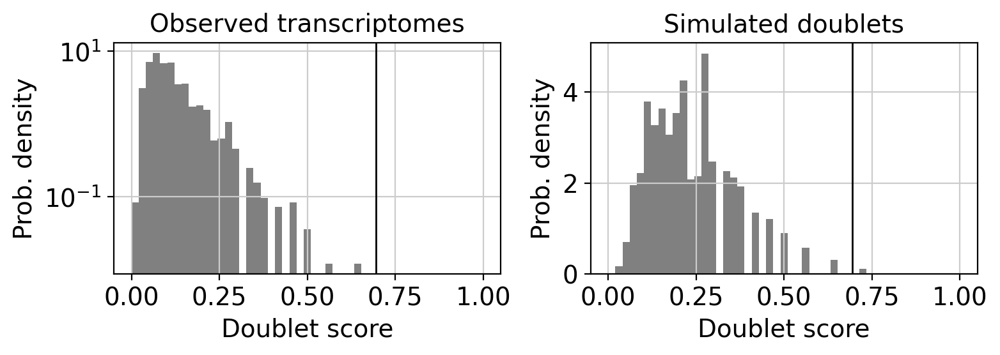

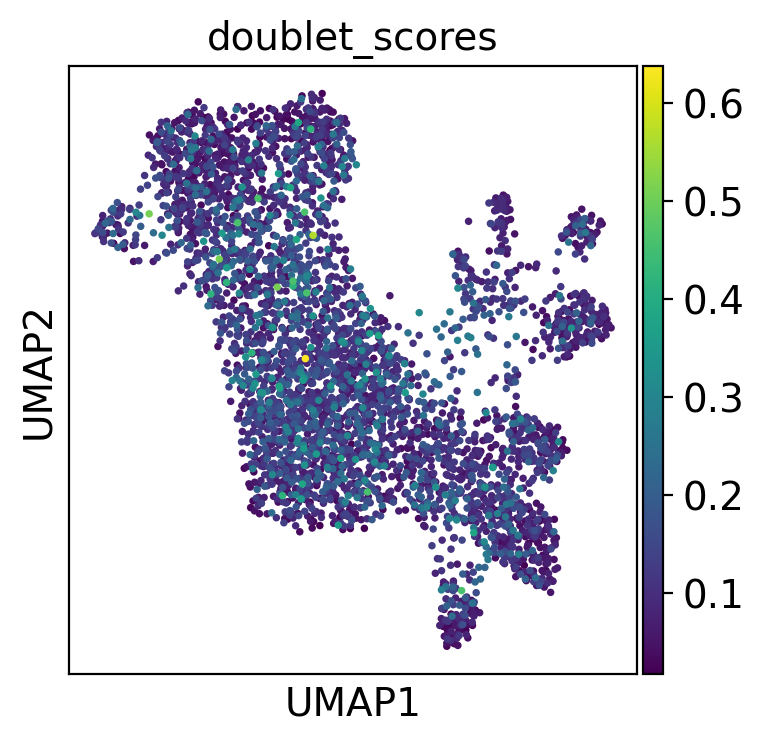

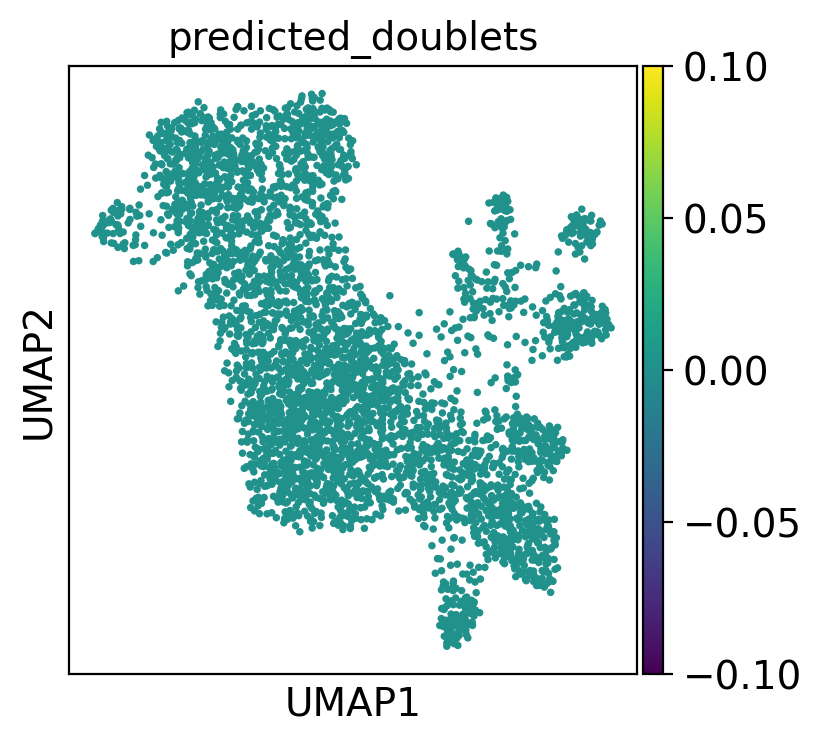

... storing 'sample' as categorical
... storing 'sample_description' as categorical
... storing 'batch' as categorical
... storing 'feature_types' as categorical


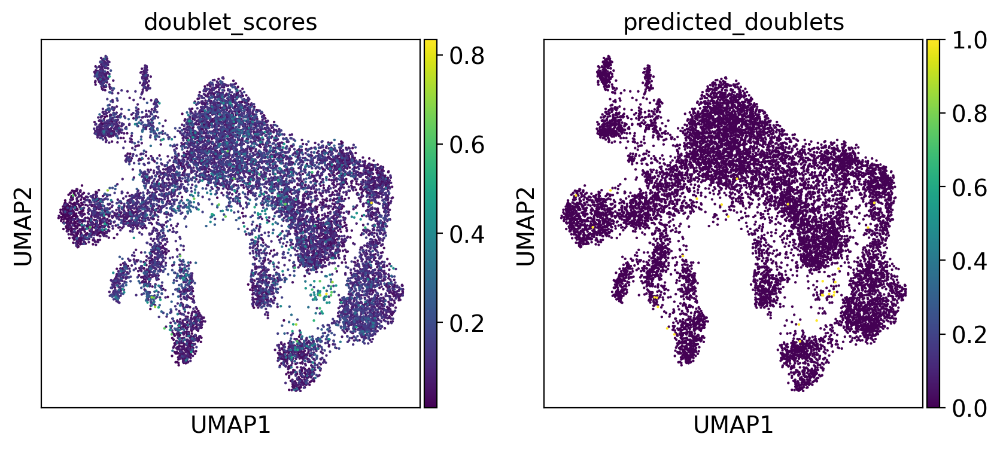

In [6]:
import scrublet as scr

adata.obs['predicted_doublets']= False
adata.obs['doublet_scores']= 0
for s in np.unique(adata.obs["sample"]):
    print(s)
    adt = adata[adata.obs["sample"]==s]
    scrub = scr.Scrublet(adt.X)
    adt.obs['doublet_scores'], adt.obs['predicted_doublets'] = scrub.scrub_doublets(n_prin_comps=17)
    scrub.plot_histogram()
    sc.pp.neighbors(adt)
    sc.tl.umap(adt)
    sc.pl.umap(adt, color=['doublet_scores'])
    sc.pl.umap(adt, color=['predicted_doublets'])
    adata.obs.loc[adata.obs["sample"]==s, "predicted_doublets"] = adt.obs['predicted_doublets']
    adata.obs.loc[adata.obs["sample"]==s, "doublet_scores"] = adt.obs['doublet_scores']

del adt
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.pl.umap(adata, color=['doublet_scores','predicted_doublets'])

In [7]:
#remove douplets
adata = adata[adata.obs['predicted_doublets'].astype("str") == 'False',:]
print(adata.shape)
sc.pp.calculate_qc_metrics(adata, qc_vars=["mt"], inplace=True)

(12278, 19271)


Trying to set attribute `.obs` of view, copying.


## Batch correction

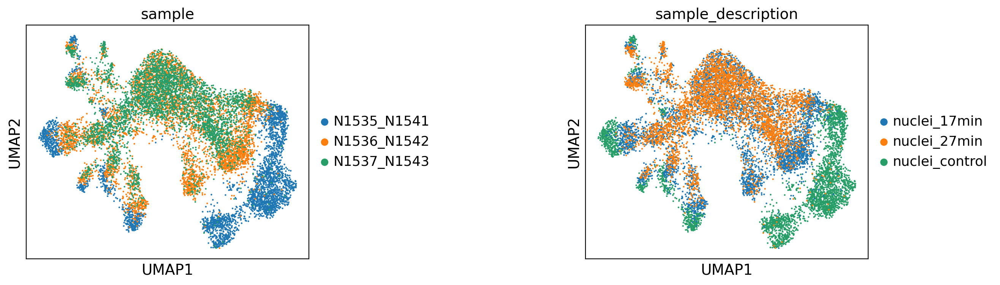

In [8]:
sc.pl.umap(adata, color=["sample", "sample_description"], wspace=0.8)

In [9]:
sc.external.pp.harmony_integrate(adata, 'sample')

2022-08-23 19:48:50,481 - harmonypy - INFO - Iteration 1 of 10
2022-08-23 19:48:55,970 - harmonypy - INFO - Iteration 2 of 10
2022-08-23 19:49:02,211 - harmonypy - INFO - Iteration 3 of 10
2022-08-23 19:49:06,263 - harmonypy - INFO - Converged after 3 iterations


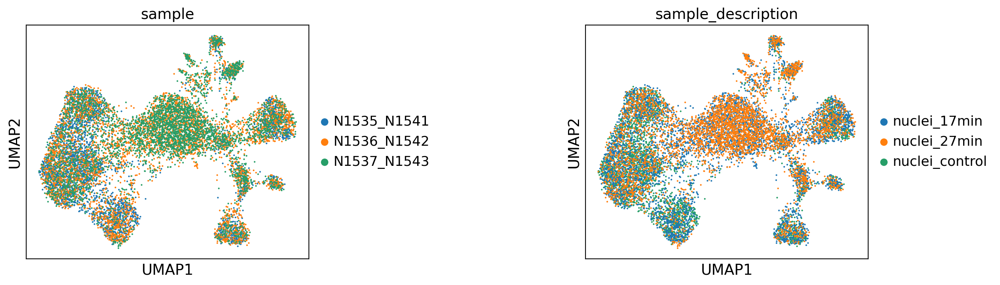

In [10]:
sc.pp.neighbors(adata, use_rep='X_pca_harmony', key_added="neighbors_harmony")
sc.tl.umap(adata, neighbors_key="neighbors_harmony" )
sc.pl.umap(adata, color=["sample", "sample_description"], wspace=0.8)

# Clustering:

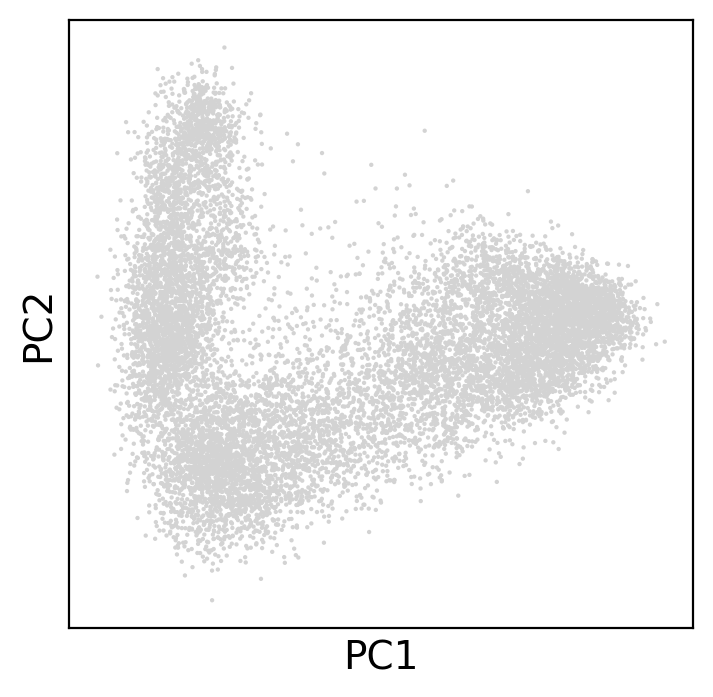

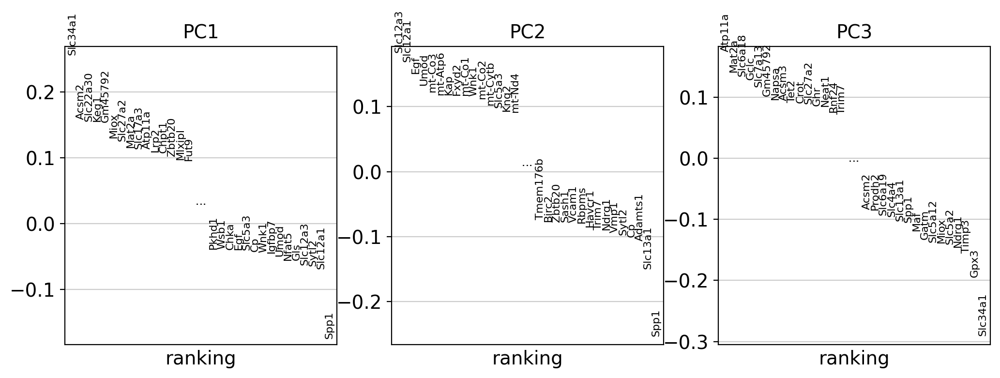

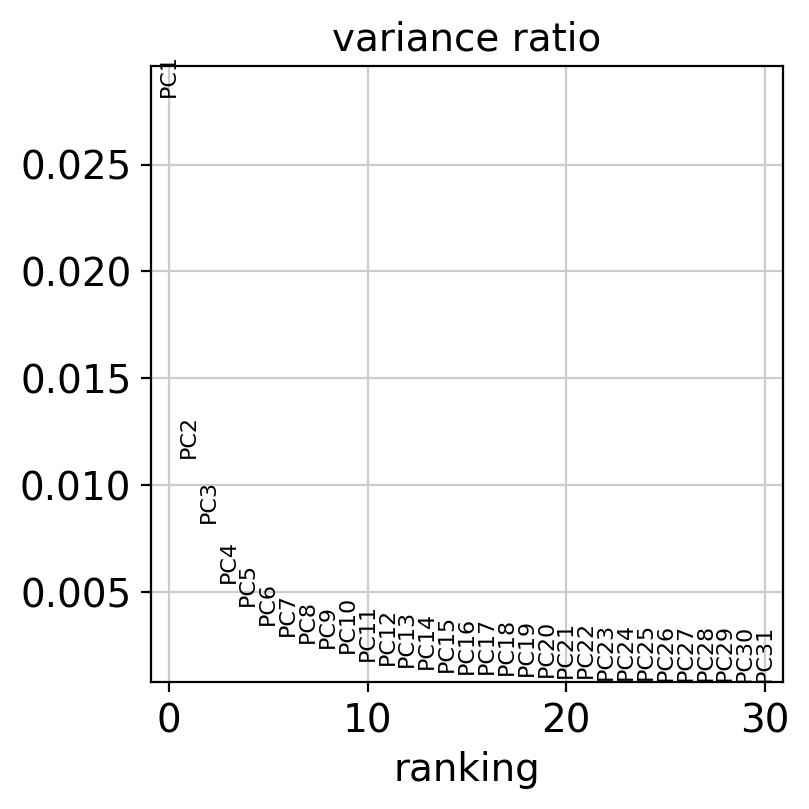

In [11]:
sc.tl.pca(adata, svd_solver='arpack')
sc.pl.pca_overview(adata)

In [12]:
sc.pp.neighbors(adata, n_neighbors=5, n_pcs=10, use_rep='X_pca_harmony')
sc.tl.louvain(adata, resolution=1.3)

In [13]:
adata.obs["n_counts_log"] = np.log(adata.obs["n_counts"])

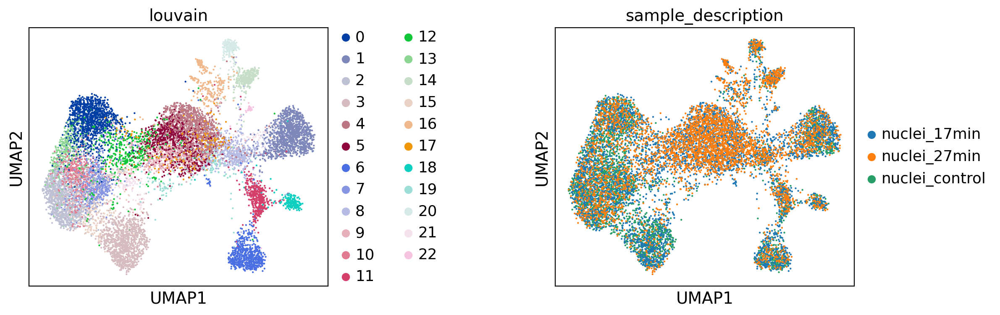

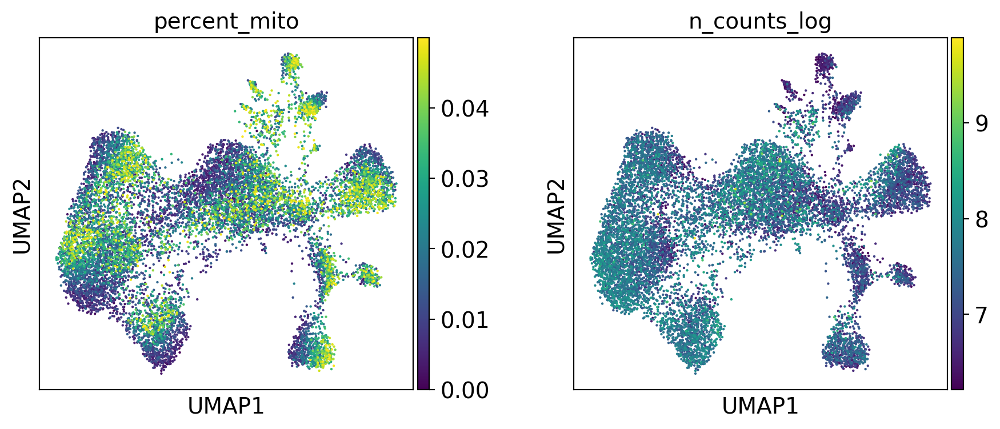

In [14]:
sc.pp.neighbors(adata, use_rep='X_pca_harmony', key_added="neighbors_harmony")
sc.tl.umap(adata, neighbors_key="neighbors_harmony" )
sc.pl.umap(adata ,color=["louvain","sample_description"], wspace=0.6)#, save="_sn_sample.pdf")
sc.pl.umap(adata, color=['percent_mito',"n_counts_log"], wspace=0.3)

Macro


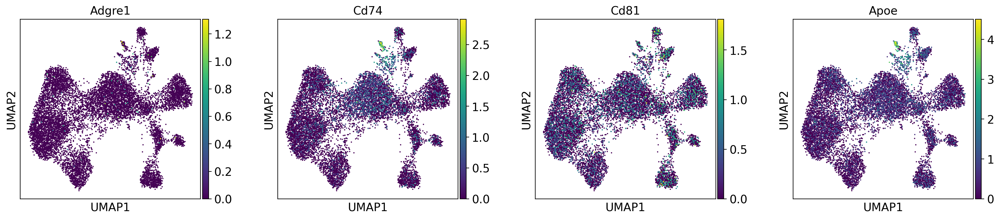

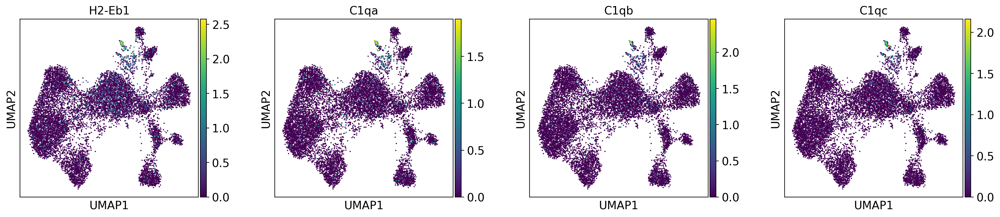

Neutro, NK, Dend


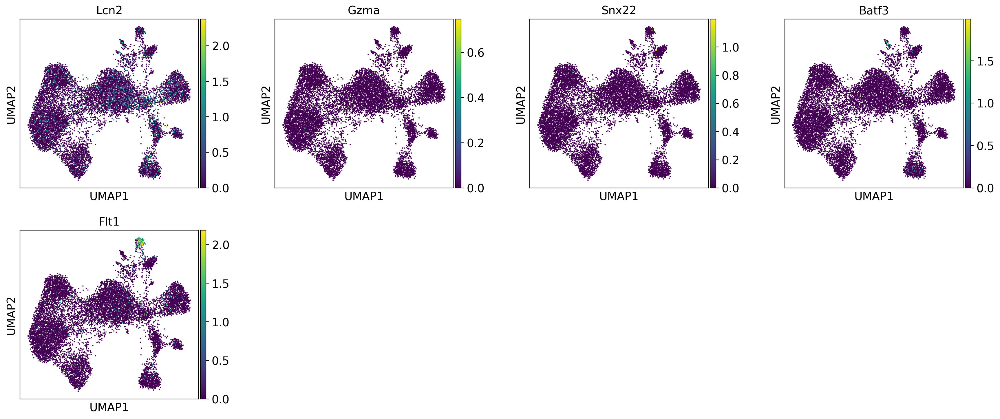

In [15]:
print("Macro")
sc.pl.umap(adata, color=['Adgre1', "Cd74", "Cd81", "Apoe"], wspace=0.3)
sc.pl.umap(adata, color=["H2-Eb1", "C1qa", "C1qb", "C1qc"], wspace=0.3)

print("Neutro, NK, Dend")
sc.pl.umap(adata, color=["Lcn2", "Gzma", "Snx22", "Batf3", "Flt1"], wspace=0.3)

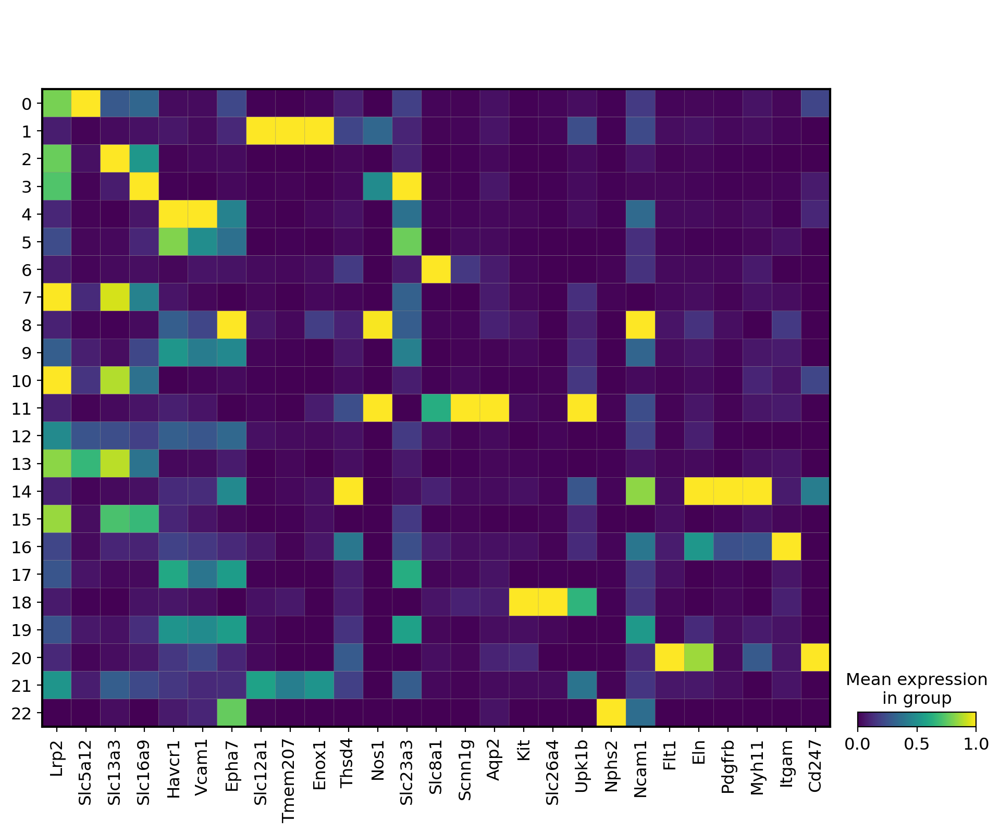

In [16]:
sc.pl.matrixplot(adata, groupby="louvain", var_names = ["Lrp2", "Slc5a12", "Slc13a3", "Slc16a9","Havcr1",
                                                        "Vcam1","Epha7","Slc12a1","Tmem207","Enox1",
                                                       "Thsd4","Nos1","Slc23a3","Slc8a1","Scnn1g","Aqp2", 
                                                        "Kit", "Slc26a4","Upk1b","Nphs2","Ncam1","Flt1",
                                                       "Eln","Pdgfrb","Myh11","Itgam","Cd247"],
                standard_scale="var")

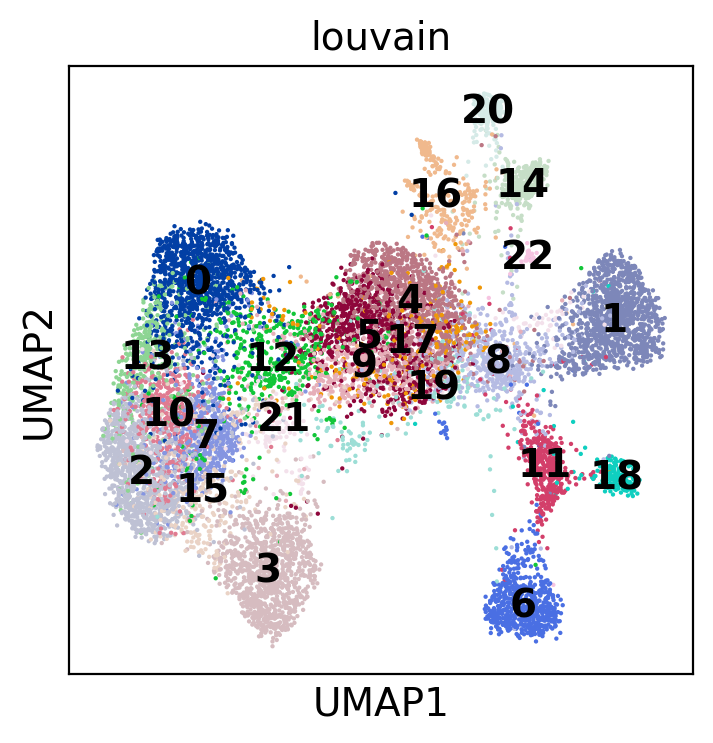

In [17]:
sc.pl.umap(adata, color="louvain", legend_loc="on data")

## number of cells per cluster

In [18]:
adata.obs['louvain'].value_counts()
adata.obs.groupby(["louvain", "sample_description"]).count()["sample"]

louvain  sample_description
0        nuclei_17min          392
         nuclei_27min          310
         nuclei_control        489
1        nuclei_17min          454
         nuclei_27min          307
                              ... 
21       nuclei_27min           41
         nuclei_control         45
22       nuclei_17min           17
         nuclei_27min           12
         nuclei_control          3
Name: sample, Length: 69, dtype: int64

# Celltype Identification
## markergenes

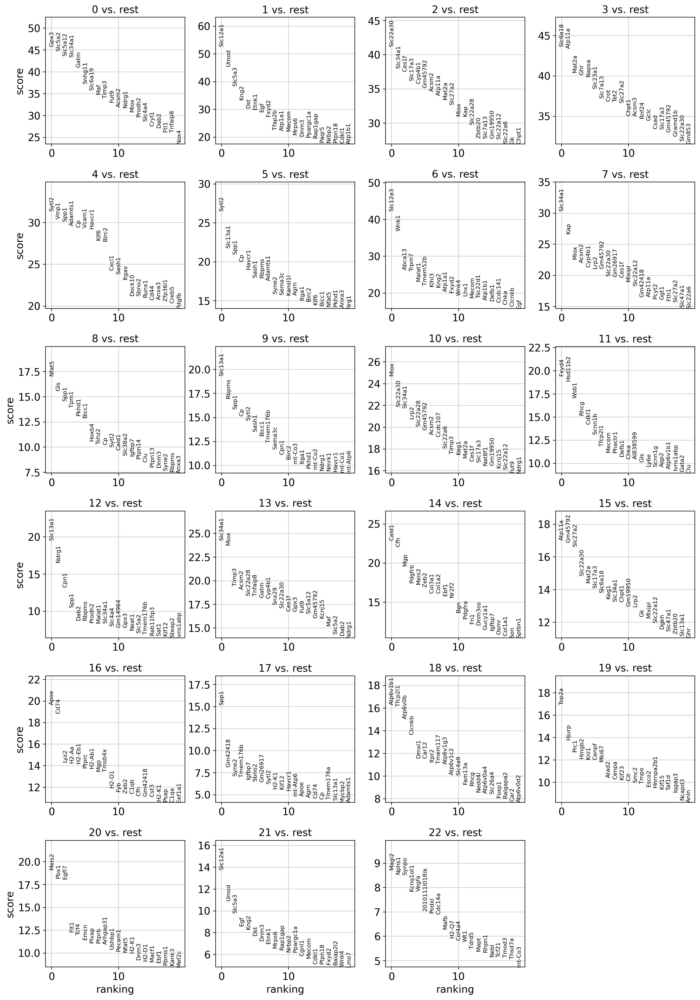

In [19]:
sc.tl.rank_genes_groups(adata, 'louvain', method='wilcoxon')
sc.pl.rank_genes_groups(adata, n_genes=20, sharey=False)

In [20]:
filelist = [ f for f in os.listdir(config["PATHS"]["OUTPUT"]+"/Markergenes/") if "sn_" in f ]
for f in filelist:
    os.remove(os.path.join(config["PATHS"]["OUTPUT"]+"/Markergenes/", f))

In [21]:
#Export calculated Markers (DGE)
result = adata.uns['rank_genes_groups']
cluster = result['names'].dtype.names
result
for c in cluster:
    df = pd.DataFrame({key: result[key][c]
    for key in ['names','logfoldchanges','pvals','pvals_adj']})
    #df.to_csv(config["PATHS"]["OUTPUT"]+'/Markergenes/'+c+"_sn_markergenes.csv")

## Literaturemarker

In [22]:
markergenes = pd.read_csv(config["PATHS"]["DATA"]+"/KideyMarkerGenes.txt", sep="\t")[["Type","Gene"]]
marker_dict = dict()
for celltype in np.unique(markergenes.Type):
    l = list(markergenes[markergenes["Type"] == celltype].Gene)
    l = [g for g in l if g in adata.var_names]
    marker_dict[celltype] = l

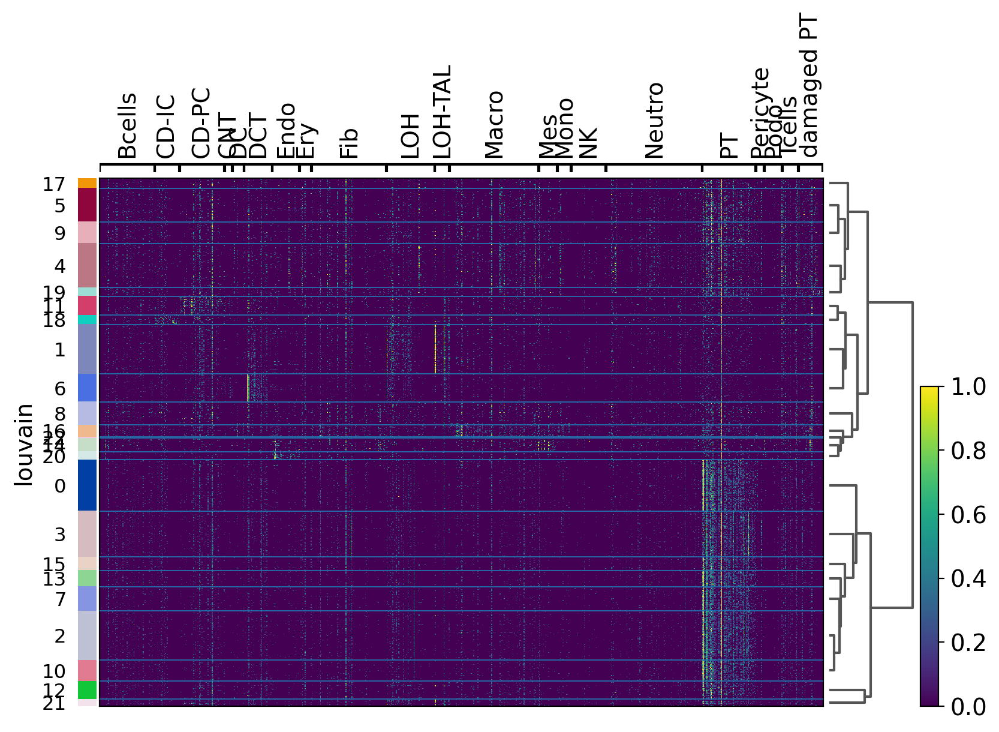

In [23]:
sc.pl.heatmap(adata, marker_dict, groupby="louvain", use_raw=True, dendrogram=True, standard_scale="obs")

In [24]:
marker_dict_light = {
    
    "CD-IC":['Atp6v1g3', 'Atp6v0d2'],    
    'CD-PC':['Aqp2','Hsd11b2'],
    'CNT':["Trpv5"],
    'DCT':["Slc12a3"],
    'Endo':['Kdr',"Nrp1","Egfl7", "Flt1"],
    'Ery':['Alas2', 'Cd36', 'Cd44'],
    'Fib':["Plac8","S100a4","Eln"],
    'LOH':["Slc12a1"],
    'LOH-TAL':['Slc12a1', 'Smarcd3'], 
    'Mes':['Arid5b', 'Ccr7'], 
    'PT':["Apoe",'Slc34a1',"Myh11"],
    'Pericyte':['Acta2', 'Alpl'], 
    'Podo':['Nphs2','Nphs1'],    
    'damaged PT':["Havcr1"], 
    
    "Bcells":['Cd79a','Cd79b',"Cd81",],
    'Tcells':["Cd3g","Cd3e"],
    'Macro':['Adgre1',"C1qa","C1qb","C1qc","Cd74","Batf3"],
    'DC':[ 'Ccl17', 'Cd14'],
    'NK':['Gzma', 'Nkg7'],
    'Mono':["Adgre1",'Ccr2', 'Cd14', 'Cd44',"Pdgfrb"],
    'Neutro':['S100a8', 'S100a9']
}

marker_dict_light2 = {    
    "B":['Cd79a'],
    "CD-IC":['Atp6v1g3'],    
    'CD-PC':['Aqp2'],
    'DC':[ 'S100g'],
    'Endo':["Egfl7"],
    'LOH':["Umod", "Slc12a1"],   
    'Mes':['Pdgfrb'], 
    'NK':['Gzma'],
    'Neutro':['S100a8'],
    'PT':["Lrp2"],
    'Podo':['Nphs2'],   
    'T':["Cd3g"], 
    'damaged PT':["Havcr1"], 
    "u":["Ccr7"],
    "ΜΦ":["C1qa"]  ,
    "DCT":["Slc12a3"],  
    "DC/Mono":["Itgax"],
    "Macro": ["Cx3cr1"]
}

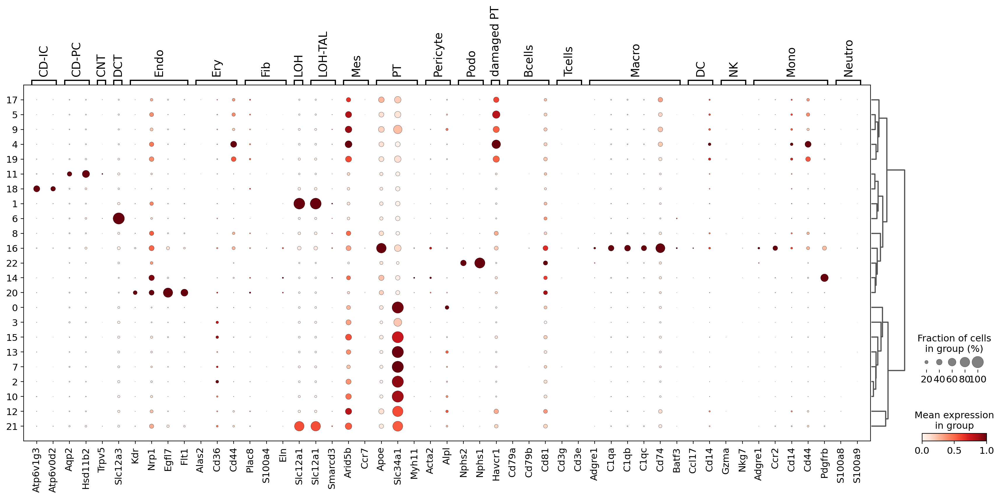

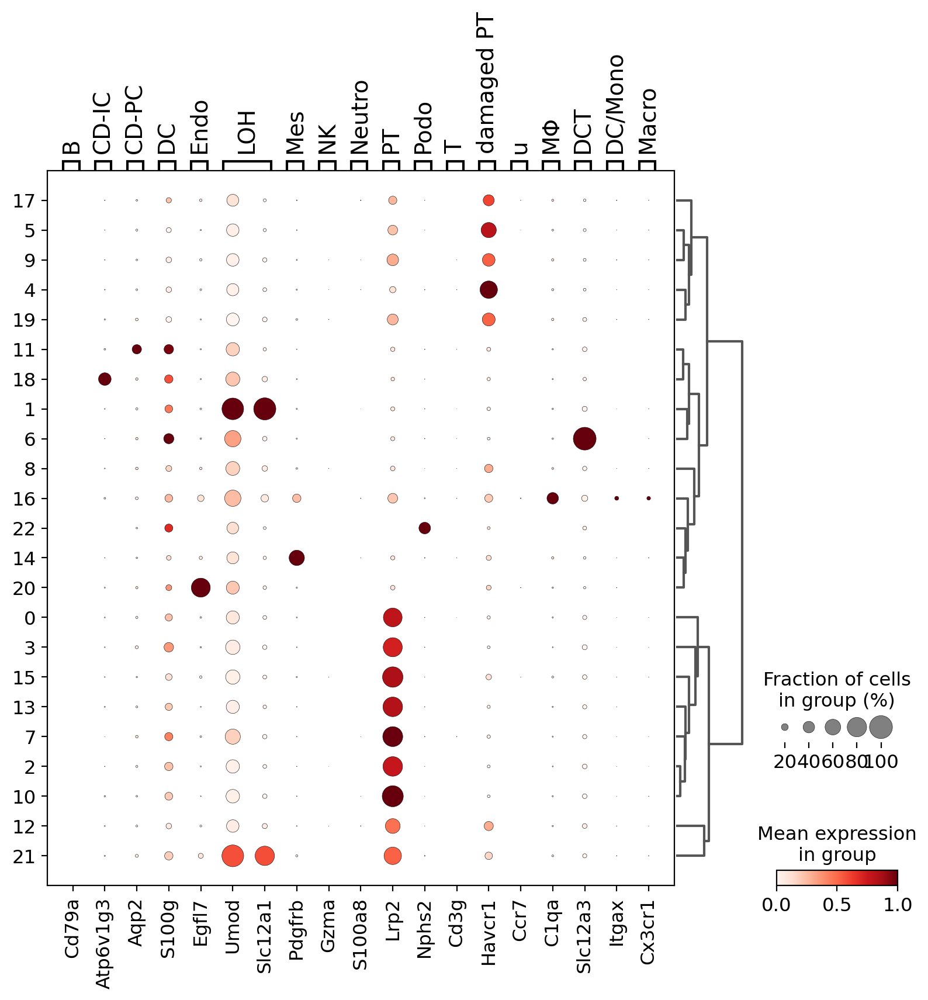

In [25]:
sc.pl.dotplot(adata, marker_dict_light, groupby='louvain', dendrogram=True, use_raw=True, standard_scale ="var")
sc.pl.dotplot(adata, marker_dict_light2, groupby='louvain', dendrogram=True, use_raw=True, standard_scale ="var")

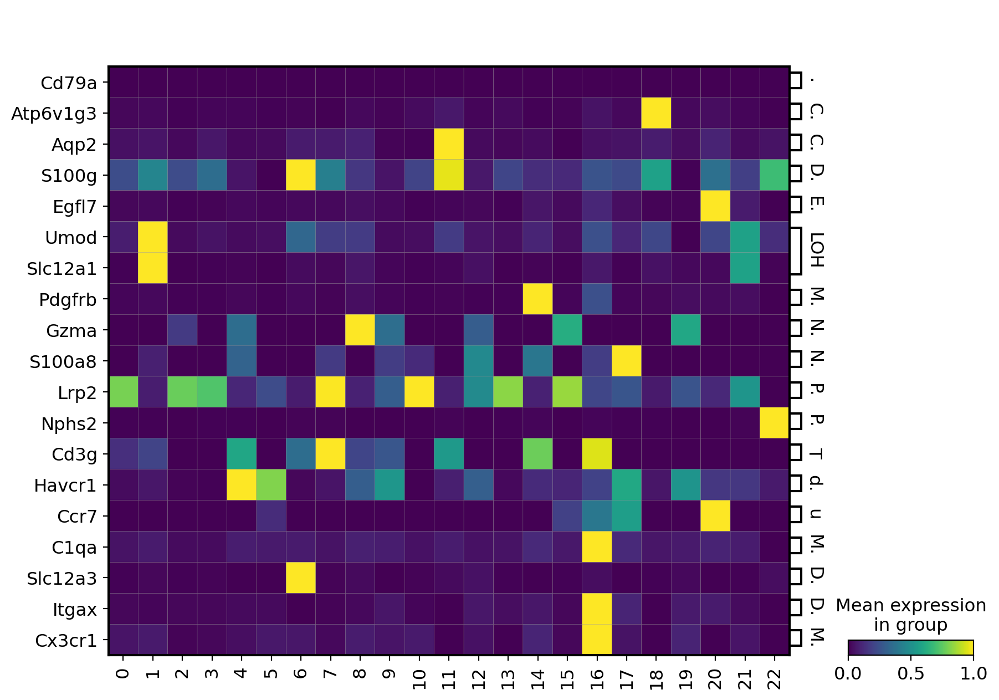

In [26]:
sc.pl.matrixplot(adata, groupby="louvain",                        
                var_names = marker_dict_light2,
                standard_scale="var", swap_axes=True)

## final annotation

In [27]:
new_cluster_names = ["PT","LOH","PT2","PT3","damagedPT","damagedPT2","DCT","PT4","damagedPT3","damagedPT4",
                     "PT5","CDPC","PT6","PT7","Mes","PT8","ΜΦ",
                     "damagedPT5","CDIC","damagedPT6","Endo","LOH2",
                     "Podo"]
adata.obs["celltype"] = adata.obs["louvain"]
adata.rename_categories('celltype', new_cluster_names)

old_to_new = dict(
    PT="PT",
    LOH="LOH",
    PT2="PT",
    PT3="PT",
    damagedPT="damaged PT",
    damagedPT2="damaged PT",
    DCT ="DCT",
    PT4="PT",
    damagedPT3="damaged PT",
    damagedPT4="damaged PT",
    PT5="PT",
    CDPC="CD-PC",
    PT6="PT",
    PT7="PT",
    Mes="Mes",
    PT8="PT",
    ΜΦ="ΜΦ",
    damagedPT5="damaged PT",
    CDIC="CD-IC",
    damagedPT6="damaged PT",
    Endo="Endo",
    LOH2="LOH",
    Podo="Podo")

adata.obs['celltype'] = (
    adata.obs['celltype']
    .map(old_to_new)
    .astype('category'))

In [28]:
celltypes = ['Endo', 'CD-IC', 'PT', 'B', 'NK', 'Macro', 'CD-PC', 'Fib', 'T',
             'Neutro', 'DCT', 'ΜΦ', 'Podo', 'Mes', 'damaged PT', 'LOH', "others", "DC"]
colors = ['#1f77b4', '#ff7f0e', '#279e68', '#d62728', '#aa40fc', '#8c564b', '#e377c2', 
          '#b5bd61', '#17becf', '#aec7e8', '#ffbb78', '#98df8a', '#ff9896', '#c5b0d5', '#c49c94',
          '#f7b6d2',"#cffc03", "#32a86d"]
colors = dict(zip(celltypes, colors))

adata.obs["celltype"] = adata.obs["celltype"].cat.reorder_categories(['Endo', 'CD-IC', 'PT', 'CD-PC',
              'DCT', 'ΜΦ', 'Podo', 'Mes', 'damaged PT', 'LOH'])
adata.uns["celltype_colors"] =  [colors[c] for c in adata.obs.celltype.cat.categories]

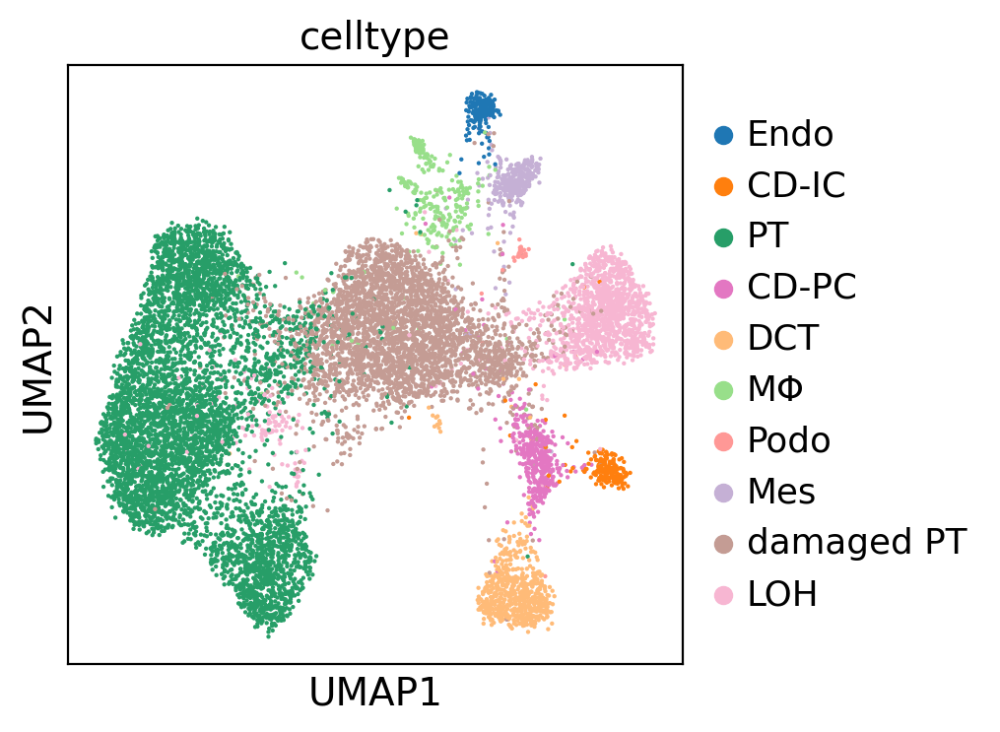

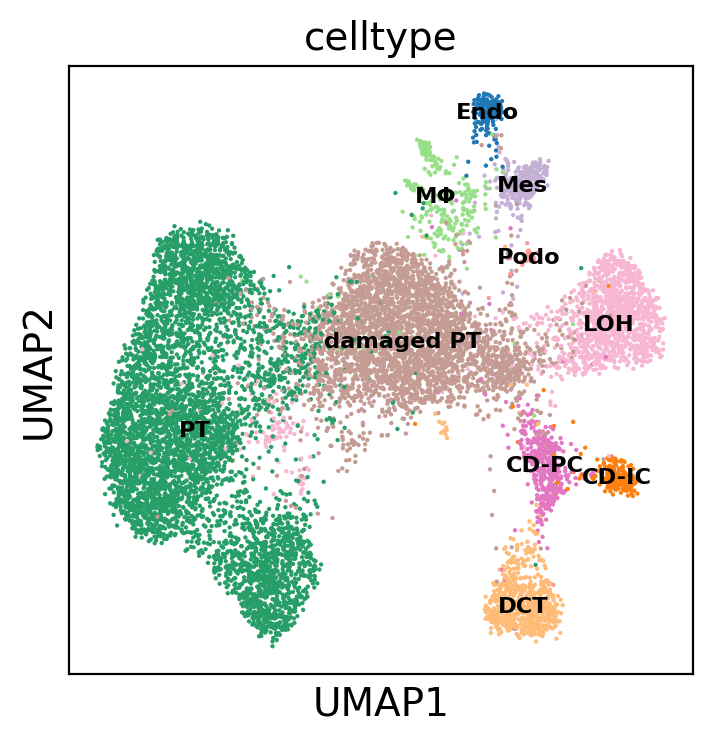

In [29]:
sc.pl.umap(adata, color="celltype")
sc.pl.umap(adata, color="celltype",legend_loc ="on data", legend_fontsize  ="xx-small")#, save="_sn_celltype.pdf")

In [30]:
print("number of features/cell or nucleus per cell type")
adata.obs['n_counts2'] = adata.X.sum(axis=1).A1
adata.obs.groupby(["celltype"]).mean()[['n_counts2']]

number of features/cell or nucleus per cell type


,n_counts2
celltype,
Endo,544.944397
CD-IC,593.269653
PT,669.018311
CD-PC,587.047119
DCT,599.657349
ΜΦ,659.657898
Podo,528.304077
Mes,592.288391
damaged PT,659.069641


In [31]:
print("Numbers of cells per timepoint:")
adata.obs.groupby(["sample_description"]).count()["sample"]

Numbers of cells per timepoint:


sample_description
nuclei_17min      4622
nuclei_27min      4122
nuclei_control    3534
Name: sample, dtype: int64

In [32]:
print("Numbers of cells per celltype and timepoint:")
adata.obs.groupby(["celltype", "sample_description"]).count()["sample"]

Numbers of cells per celltype and timepoint:


celltype    sample_description
Endo        nuclei_17min            66
            nuclei_27min            70
            nuclei_control          53
CD-IC       nuclei_17min            85
            nuclei_27min            58
            nuclei_control          67
PT          nuclei_17min          1863
            nuclei_27min          1256
            nuclei_control        2445
CD-PC       nuclei_17min           169
            nuclei_27min           143
            nuclei_control         129
DCT         nuclei_17min           270
            nuclei_27min           117
            nuclei_control         255
ΜΦ          nuclei_17min           106
            nuclei_27min           150
            nuclei_control          19
Podo        nuclei_17min            17
            nuclei_27min            12
            nuclei_control           3
Mes         nuclei_17min           108
            nuclei_27min           166
            nuclei_control          41
damaged PT  nuclei_17min         

In [33]:
print("Numbers of cells per celltype:")
adata.obs.groupby(["celltype"]).count()["sample"]

Numbers of cells per celltype:


celltype
Endo           189
CD-IC          210
PT            5564
CD-PC          441
DCT            642
ΜΦ             275
Podo            32
Mes            315
damaged PT    3289
LOH           1321
Name: sample, dtype: int64

In [34]:
pt= ["PT","damaged PT"]
adata_pt = adata[adata.obs['celltype'].isin(pt)]

In [35]:
#adata_pt.write(config["PATHS"]["OUTPUT"]+"/sn_pt.h5ad")
#adata.write(config["PATHS"]["OUTPUT"]+"/sn_5mt.h5ad")

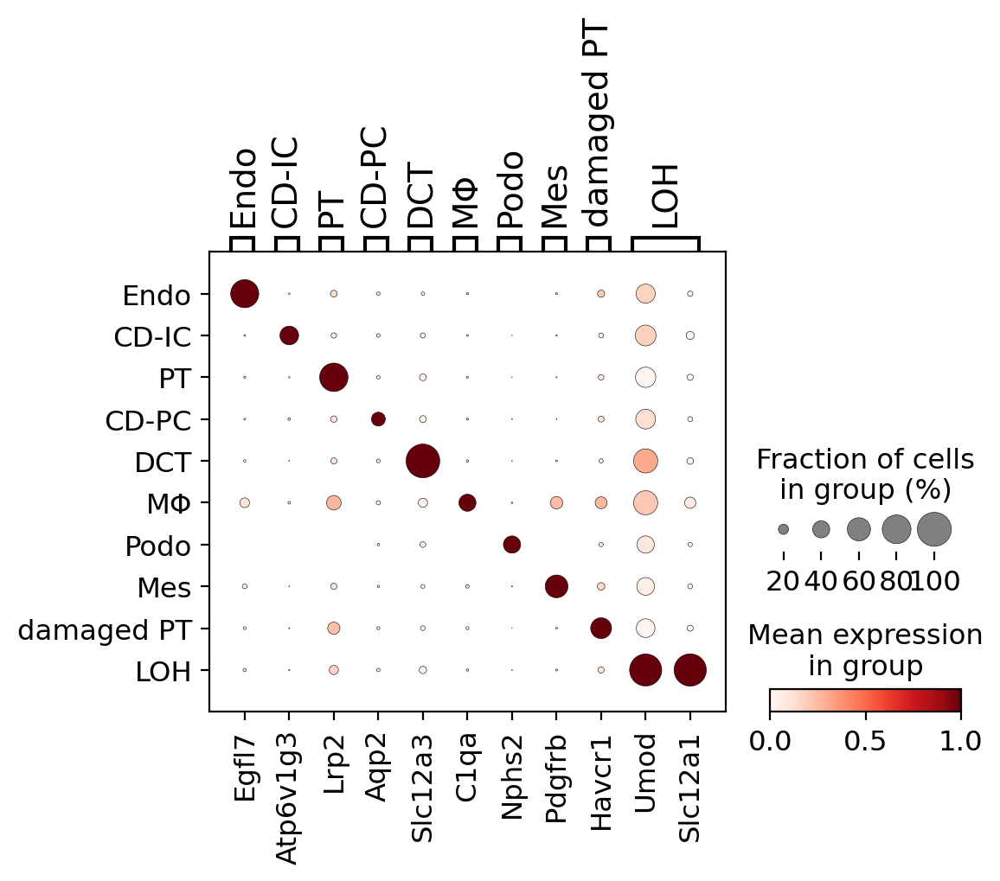

In [36]:
marker_dict_light2 = {
    'Endo':["Egfl7"],
    "CD-IC":['Atp6v1g3'], 
    'PT':["Lrp2"],  
    'CD-PC':['Aqp2'],   
    "DCT":["Slc12a3"], 
    "ΜΦ":["C1qa"] , 
    'Podo':['Nphs2'],
    'Mes':['Pdgfrb'], 
    'damaged PT':["Havcr1"],    
    'LOH':["Umod", "Slc12a1"], 
}
    
sc.pl.dotplot(adata, marker_dict_light2, groupby='celltype', 
              dendrogram=False, use_raw=True, standard_scale ="var")#, save="_sn.pdf")

# umap per timepoint

#### control

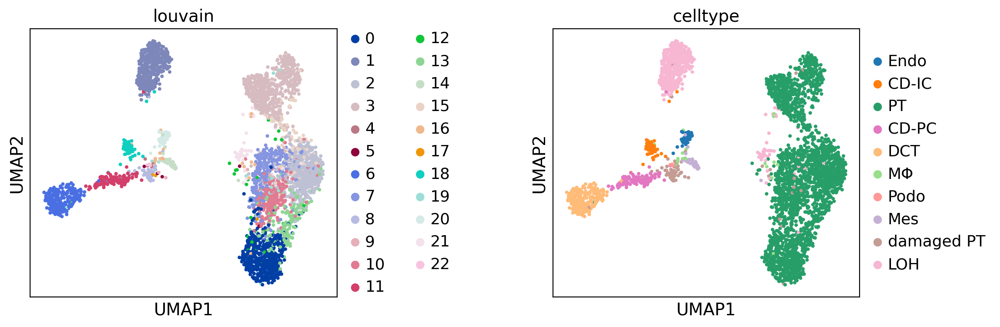

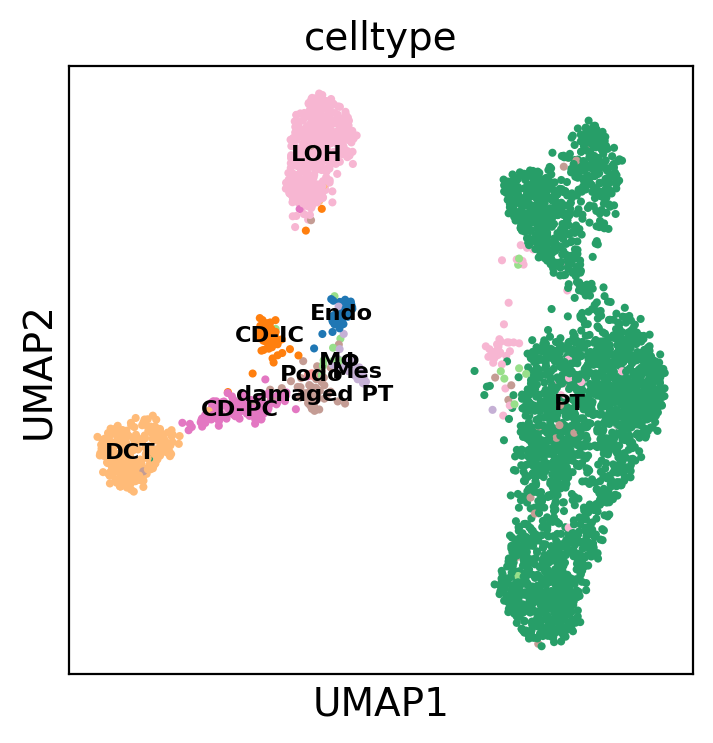

In [37]:
adata_c = adata[adata.obs.sample_description =="nuclei_control"] 
sc.tl.pca(adata_c, svd_solver='arpack')
sc.pp.neighbors(adata_c)
sc.tl.umap(adata_c)
sc.pl.umap(adata_c,color=["louvain","celltype"],wspace=0.55)
sc.pl.umap(adata_c ,color=["celltype"],wspace=0.55,legend_loc ="on data", 
           legend_fontsize ="xx-small")#, save="_sn_c.pdf")

Numbers of cells per celltype:
others (smaller groups): 
  celltype  sample
6     Podo       3
              celltype  cells       %
celltype                             
Endo              Endo     53    1.5%
CD-IC            CD-IC     67    1.9%
PT                  PT   2445  69.19%
CD-PC            CD-PC    129   3.65%
DCT                DCT    255   7.22%
ΜΦ                  ΜΦ     19   0.54%
Podo              Podo      3   0.08%
Mes                Mes     41   1.16%
damaged PT  damaged PT     81   2.29%
LOH                LOH    441  12.48%


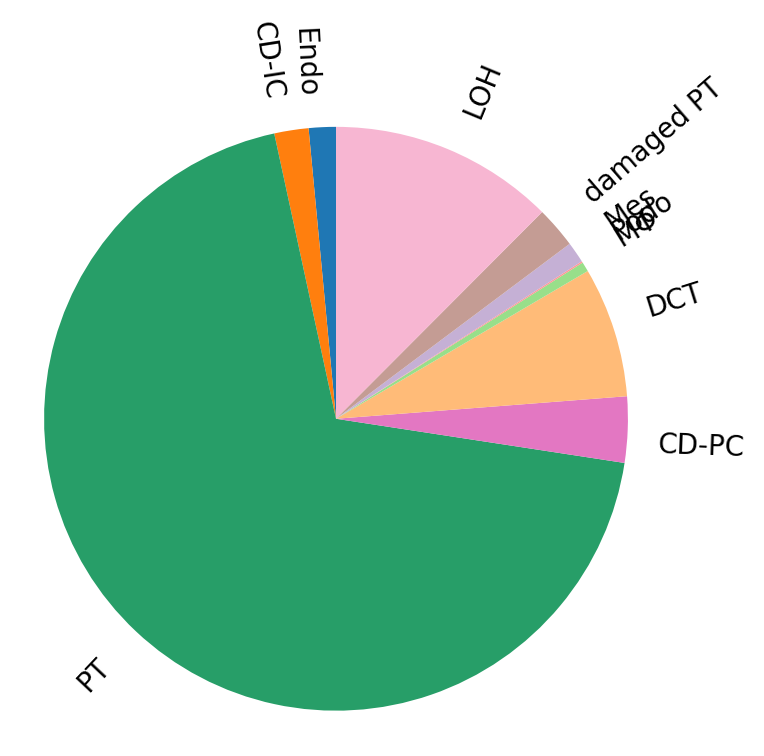

In [38]:
print("Numbers of cells per celltype:")
counts = adata_c.obs.groupby(["celltype"]).count()["sample"].reset_index()
counts = counts.sort_values("celltype")
print("others (smaller groups): ")
print(counts[(counts['sample'] < 5)])
counts.columns = ["celltype","cells"]
counts.index = counts.celltype
counts['%'] = ((counts['cells'] / counts['cells'].sum())*100).round(2).astype(str) + '%'
print(counts)

fig1, ax1 = plt.subplots()
ax1.pie(counts["cells"], labels=counts["celltype"], rotatelabels=45,
         startangle=90, colors=[colors[d] for d in counts["celltype"]], textprops={'fontsize': 10})
ax1.axis('equal') 
plt.tight_layout()
#plt.savefig( config["PATHS"]["OUTPUT"]+"/figs/sn_piechart_c.pdf", facecolor = 'white', dpi=600, bbox_inches='tight')
plt.show()

#### 17min

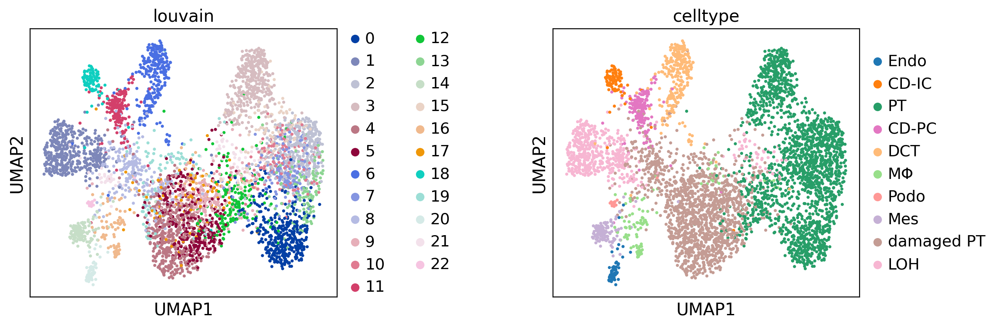

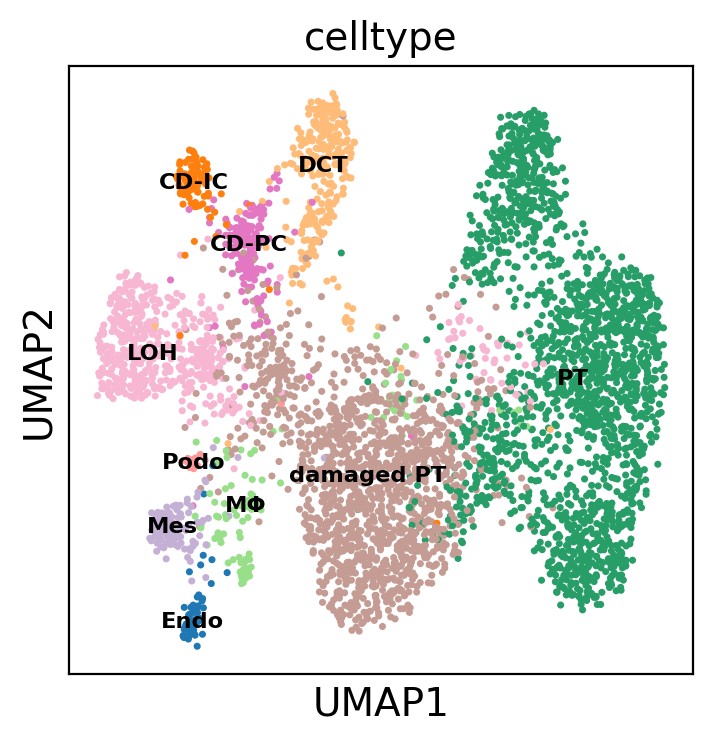

In [39]:
adata_17 = adata[adata.obs.sample_description =="nuclei_17min"] 
sc.tl.pca(adata_17, svd_solver='arpack')
sc.pp.neighbors(adata_17)
sc.tl.umap(adata_17)
sc.pl.umap(adata_17,color=["louvain","celltype"],wspace=0.55)
sc.pl.umap(adata_17 ,color=["celltype"],wspace=0.55,legend_loc ="on data",
           legend_fontsize ="xx-small")#, save="_sn_17.pdf")

Numbers of cells per celltype:
others (smaller groups): 
Empty DataFrame
Columns: [celltype, sample]
Index: []
              celltype  cells       %
celltype                             
Endo              Endo     66   1.43%
CD-IC            CD-IC     85   1.84%
PT                  PT   1863  40.31%
CD-PC            CD-PC    169   3.66%
DCT                DCT    270   5.84%
ΜΦ                  ΜΦ    106   2.29%
Podo              Podo     17   0.37%
Mes                Mes    108   2.34%
damaged PT  damaged PT   1406  30.42%
LOH                LOH    532  11.51%


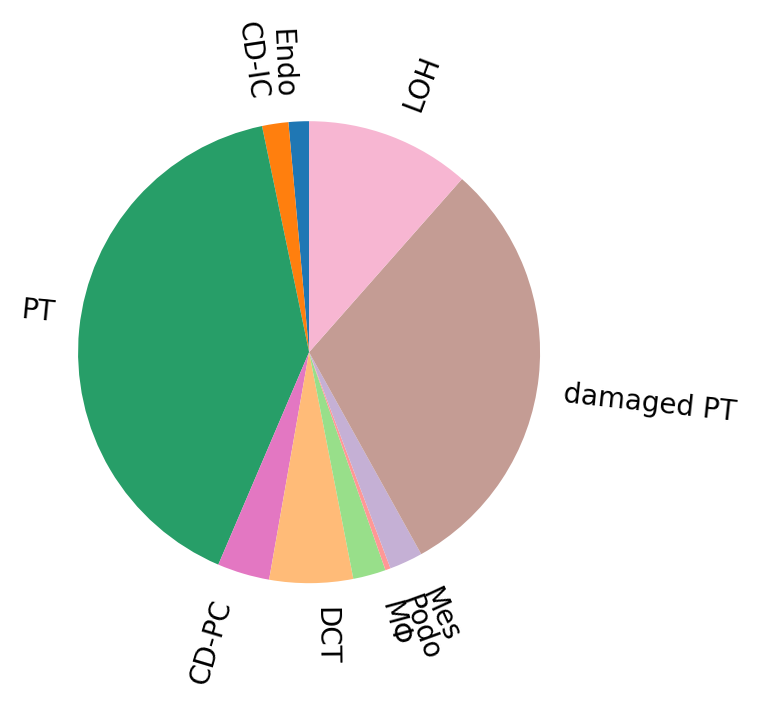

In [40]:
print("Numbers of cells per celltype:")
counts = adata_17.obs.groupby(["celltype"]).count()["sample"].reset_index()
counts = counts.sort_values("celltype")
print("others (smaller groups): ")
print(counts[(counts['sample'] < 5)])
counts.columns = ["celltype","cells"]
counts.index = counts.celltype
counts['%'] = ((counts['cells'] / counts['cells'].sum())*100).round(2).astype(str) + '%'
print(counts)

fig1, ax1 = plt.subplots()
ax1.pie(counts["cells"], labels=counts["celltype"],rotatelabels=45, 
         startangle=90, colors=[colors[d] for d in counts["celltype"]], textprops={'fontsize': 10})
ax1.axis('equal')  
plt.tight_layout()
#plt.savefig( config["PATHS"]["OUTPUT"]+"/figs/sn_piechart_17min.pdf",facecolor = 'white', dpi=600, bbox_inches='tight')
plt.show()

#### 27min

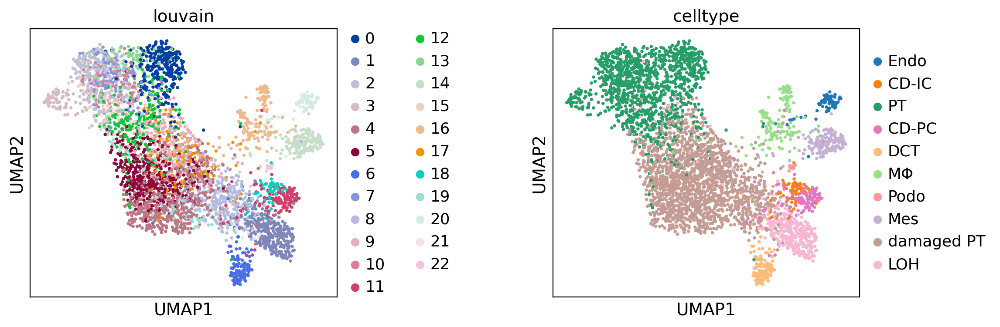

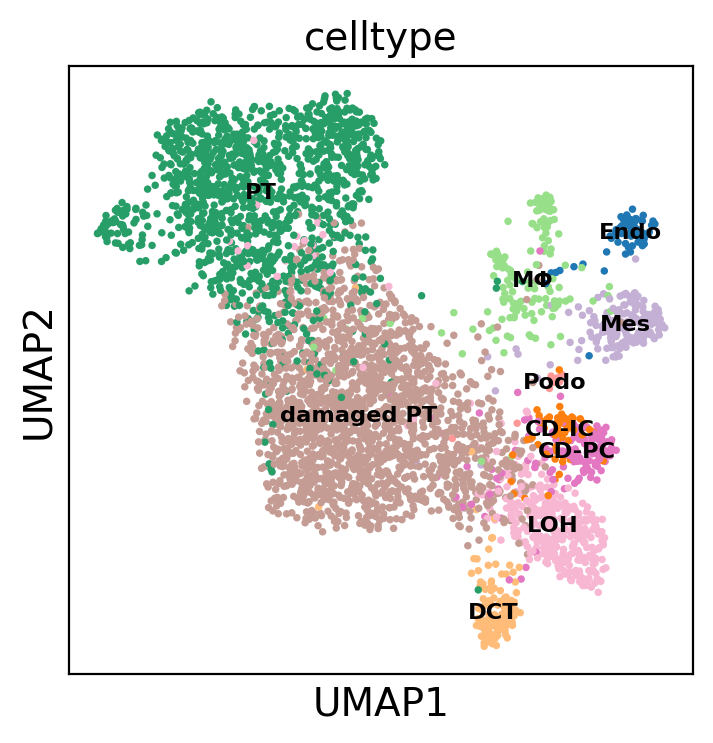

In [41]:
adata_27 = adata[adata.obs.sample_description =="nuclei_27min"]
sc.tl.pca(adata_27, svd_solver='arpack')
sc.pp.neighbors(adata_27)
sc.tl.umap(adata_27)
sc.pl.umap(adata_27,color=["louvain","celltype"],wspace=0.55)
sc.pl.umap(adata_27 ,color=["celltype"],wspace=0.55,legend_loc ="on data", 
           legend_fontsize ="xx-small")#, save="_sn_27.pdf")

Numbers of cells per celltype:
others (smaller groups): 
Empty DataFrame
Columns: [celltype, sample]
Index: []
              celltype  cells       %
celltype                             
Endo              Endo     70    1.7%
CD-IC            CD-IC     58   1.41%
PT                  PT   1256  30.47%
CD-PC            CD-PC    143   3.47%
DCT                DCT    117   2.84%
ΜΦ                  ΜΦ    150   3.64%
Podo              Podo     12   0.29%
Mes                Mes    166   4.03%
damaged PT  damaged PT   1802  43.72%
LOH                LOH    348   8.44%


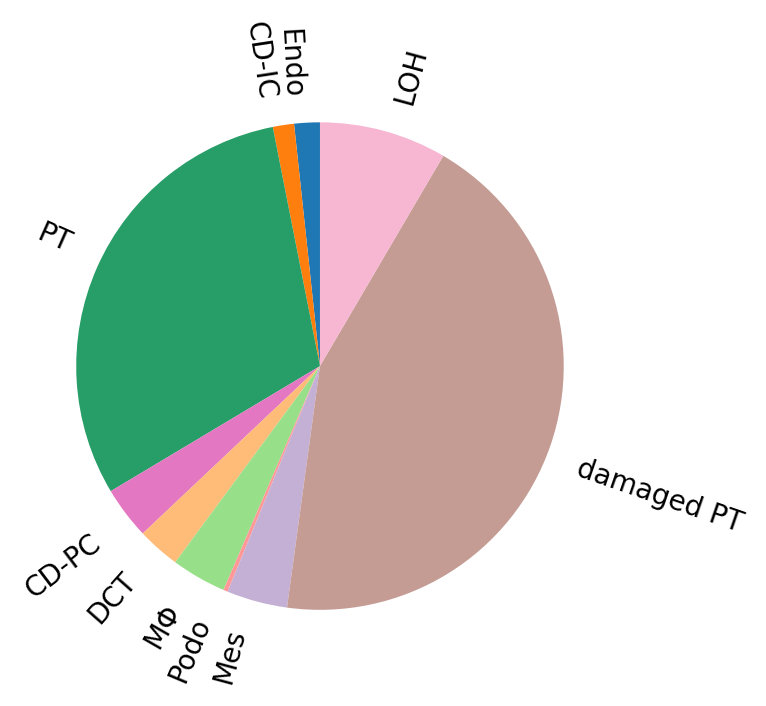

In [42]:
print("Numbers of cells per celltype:")
counts = adata_27.obs.groupby(["celltype"]).count()["sample"].reset_index()
counts = counts.sort_values("celltype")
print("others (smaller groups): ")
print(counts[(counts['sample'] < 5)])
counts.columns = ["celltype","cells"]
counts.index = counts.celltype
counts['%'] = ((counts['cells'] / counts['cells'].sum())*100).round(2).astype(str) + '%'
print(counts)

fig1, ax1 = plt.subplots()
ax1.pie(counts["cells"], labels=counts["celltype"],rotatelabels=45,
         startangle=90, colors=[colors[d] for d in counts["celltype"]], textprops={'fontsize': 10})
ax1.axis('equal')  
plt.tight_layout()
#plt.savefig( config["PATHS"]["OUTPUT"]+"/figs/sn_piechart_27min.pdf",facecolor = 'white', dpi=600, bbox_inches='tight')
plt.show()

# PT cells

In [43]:
pt= ["PT","damaged PT"]
adata_pt = adata[adata.obs['celltype'].isin(pt)]

In [44]:
#adata_pt = sc.read(config["PATHS"]["OUTPUT"]+"/sn_pt.h5ad")
adata_pt
adata_pt.obs["sample_description"] = adata_pt.obs["sample_description"].str.replace("nuclei_","")
adata_pt.obs["sample_description"] = adata_pt.obs["sample_description"].astype('category')
adata_pt.obs["sample_description"] = adata_pt.obs["sample_description"].cat.reorder_categories(['control',
                                                                                                '17min','27min'])

Trying to set attribute `.obs` of view, copying.


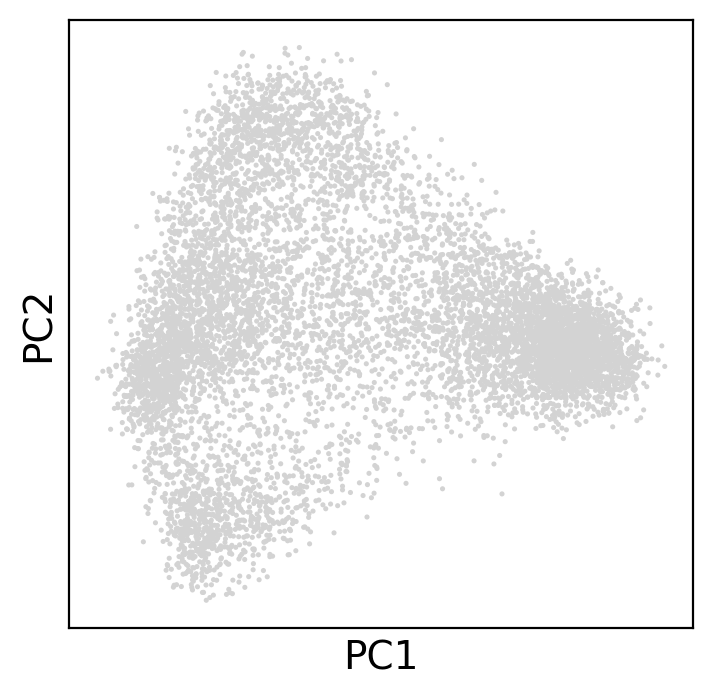

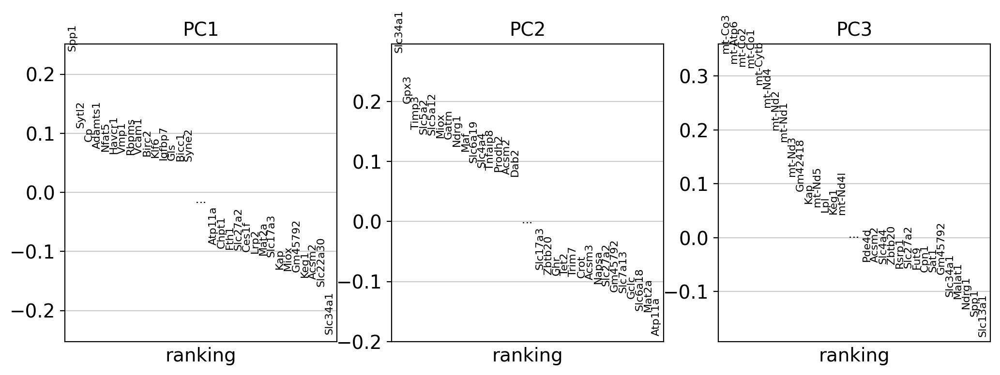

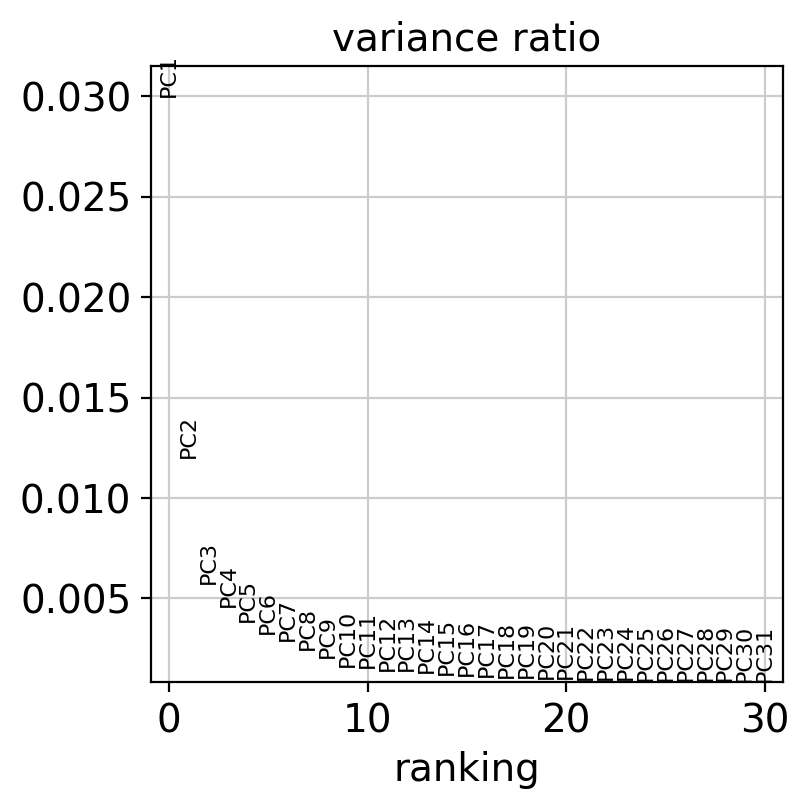

number of clusters: 9


In [45]:
sc.tl.pca(adata_pt, svd_solver='arpack')
sc.pl.pca_overview(adata_pt)
sc.pp.neighbors(adata_pt, n_neighbors=5, n_pcs=20)
sc.tl.louvain(adata_pt, resolution=0.4)
print("number of clusters:", len(np.unique(adata_pt.obs["louvain"])))

In [46]:
sc.tl.umap(adata_pt)

In [47]:
#adata_pt.write(config["PATHS"]["OUTPUT"]+"/sn_pt_newUmap.h5ad")

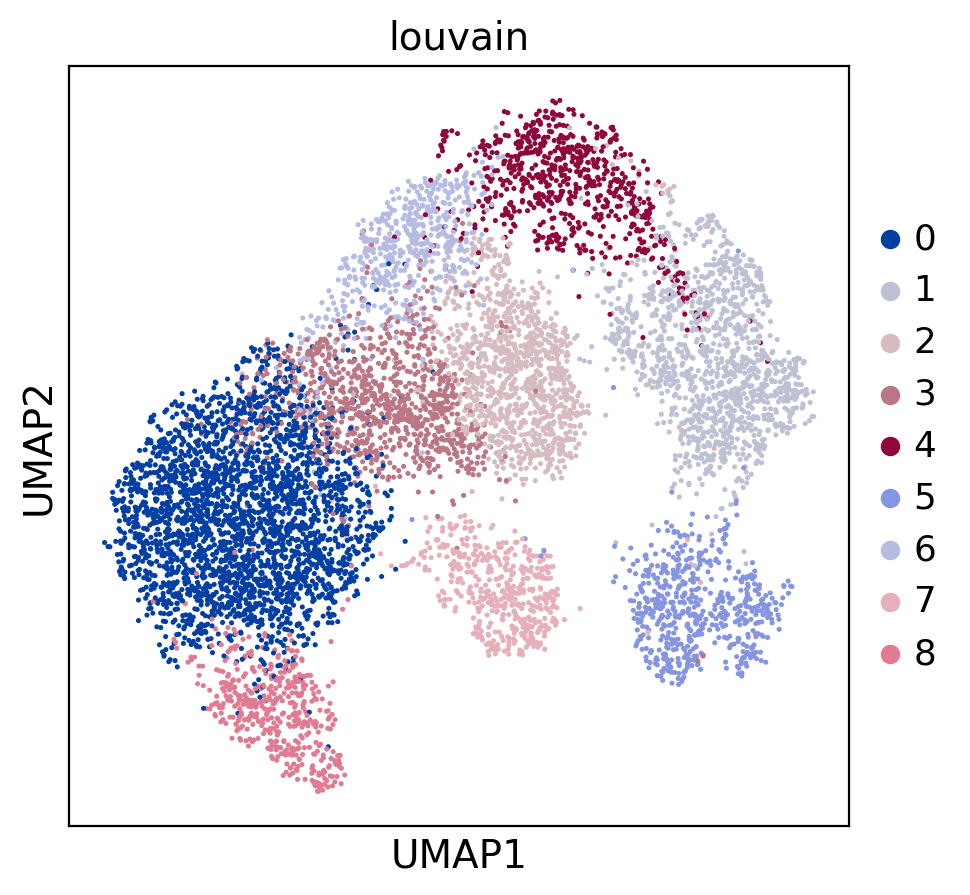

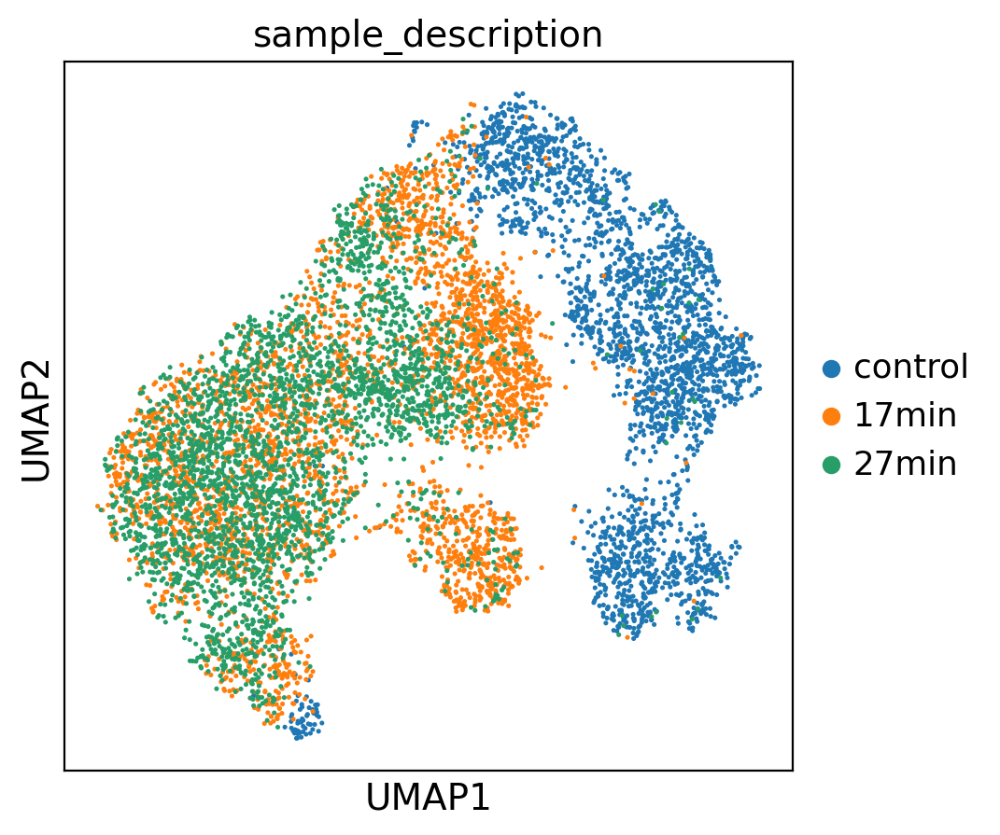

In [48]:
rcParams['figure.figsize'] = 5,5
sc.pl.umap(adata_pt, color=['louvain'], wspace=0.3)#, save="_sn_pt_clusters.png")
sc.pl.umap(adata_pt, color=['sample_description'], wspace=0.3)#, save="_sn_pt_samples.png")

# Save Notebook as html

In [49]:
%%bash
jupyter nbconvert --to html_toc script_sn_5mt_20211126_resolution13.ipynb --ExtractOutputPreprocessor.enabled=False
#mv script_sn.html ./results/script_sn.html 

[NbConvertApp] Converting notebook script_sn_5mt_20211126_resolution13.ipynb to html_toc
[NbConvertApp] Writing 17647491 bytes to script_sn_5mt_20211126_resolution13.html
